# Trajectory Analysis

## PAGA

Partition-based graph abstraction (PAGA), is an algorithm which provides an interpretable graph-like map of the arising data manifold, based on estimating connectivity of manifold partitions.

Before running `PAGA`, we need to create a group of cluster results and a neigbobor pairwise matrix. Here we use mouse embryo data for demo. Download the [example data](http://116.6.21.110:8090/share/dd965cba-7c1f-40b2-a275-0150890e005f) first.

In [32]:
import stereo as st
import warnings
warnings.filterwarnings('ignore')

# read data
data = st.io.read_h5ad('/data/work/data/Embyro_E16.5.h5ad')

# preprocessing
data.tl.cal_qc()
data.tl.normalize_total(target_sum=1e4)
data.tl.log1p()

# hvg
data.tl.highly_variable_genes(min_mean=0.0125, max_mean=3, min_disp=0.5, res_key='highly_variable_genes', n_top_genes=None)

data.tl.scale(zero_center=False)

# embedding
data.tl.pca(use_highly_genes=True, hvg_res_key='highly_variable_genes', n_pcs=20, res_key='pca', svd_solver='arpack')
data.tl.neighbors(pca_res_key='pca', n_pcs=30, res_key='neighbors', n_jobs=-1)

[2023-10-17 11:07:54][Stereo][578][MainThread][140523920922432][st_pipeline][37][INFO]: start to run cal_qc...
[2023-10-17 11:07:57][Stereo][578][MainThread][140523920922432][st_pipeline][40][INFO]: cal_qc end, consume time 2.5151s.
[2023-10-17 11:07:57][Stereo][578][MainThread][140523920922432][st_pipeline][37][INFO]: start to run normalize_total...
[2023-10-17 11:07:59][Stereo][578][MainThread][140523920922432][st_pipeline][40][INFO]: normalize_total end, consume time 2.1088s.
[2023-10-17 11:07:59][Stereo][578][MainThread][140523920922432][st_pipeline][37][INFO]: start to run log1p...
[2023-10-17 11:08:00][Stereo][578][MainThread][140523920922432][st_pipeline][40][INFO]: log1p end, consume time 0.9307s.
[2023-10-17 11:08:00][Stereo][578][MainThread][140523920922432][st_pipeline][37][INFO]: start to run highly_variable_genes...
[2023-10-17 11:08:02][Stereo][578][MainThread][140523920922432][st_pipeline][40][INFO]: highly_variable_genes end, consume time 2.4341s.
[2023-10-17 11:08:02][

In [35]:
data.tl.paga(groups='annotation', neighbors_key='neighbors')

[2023-10-17 11:09:32][Stereo][578][MainThread][140523920922432][st_pipeline][71][INFO]: register algorithm paga to <stereo.core.st_pipeline.AnnBasedStPipeline object at 0x7fcb0ca30520>


We could obtain `connectivities` and `connectivities_tree` in the result of PAGA. `connectivities_tree` indicates cluster-to-cluster relation.

In [36]:
data.tl.result['paga']

{'connectivities': <25x25 sparse matrix of type '<class 'numpy.float64'>'
 	with 356 stored elements in Compressed Sparse Row format>,
 'connectivities_tree': <25x25 sparse matrix of type '<class 'numpy.float64'>'
 	with 24 stored elements in Compressed Sparse Row format>,
 'annotation_sizes': array([ 3822,   194,  3400, 17374,  5602,  5850, 11287,  1727,  8803,
         2047,  6304,  1227,  3723,   457,  2396,  2158, 14167,  3760,
         6656,  3465,  9853,   383,  4471,  2007,   634]),
 'groups': 'annotation'}

## Visualization For PAGA

[2023-10-17 11:09:38][Stereo][578][MainThread][140523920922432][plot_collection][61][INFO]: register plot_func paga_plot to <stereo.plots.plot_collection.PlotCollection object at 0x7fcb0ca2f2e0>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

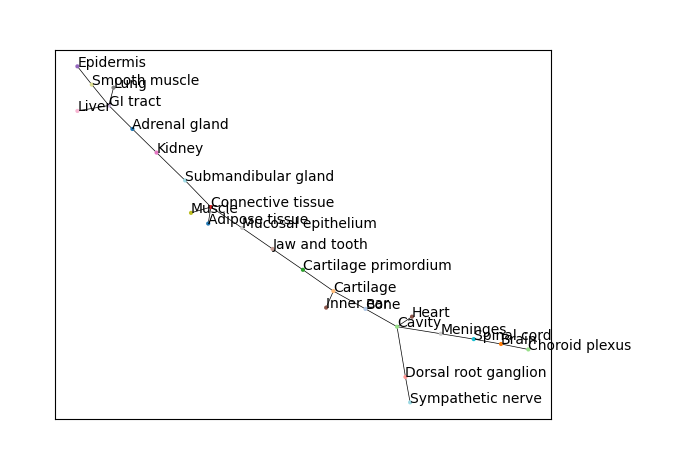

In [37]:
data.plt.paga_plot(
            adjacency='connectivities_tree', # keyword to use for paga or paga tree
            threshold=0.01, # prune edges lower than threshold
            layout='fr' # the method to layout each node
            )

# TODO:

这个函数慢的有点不合理

In [ ]:
data.plt.paga_compare(
        adjacency='connectivities_tree',
        threshold=0.01,
        layout='fr'
        )

[2023-10-17 13:54:58][Stereo][578][MainThread][140523920922432][plot_collection][61][INFO]: register plot_func paga_compare to <stereo.plots.plot_collection.PlotCollection object at 0x7fcb0ca2f2e0>


## Cluster Trajectory

Plot the cluster trajectory described by the result of PAGA.

[2023-08-28 17:43:27][Stereo][27850][MainThread][140368996955968][plot_collection][61][INFO]: register plot_func plot_cluster_traj to <stereo.plots.plot_collection.PlotCollection object at 0x7faa2474a2e0>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

<Figure size 6400x4800 with 0 Axes>

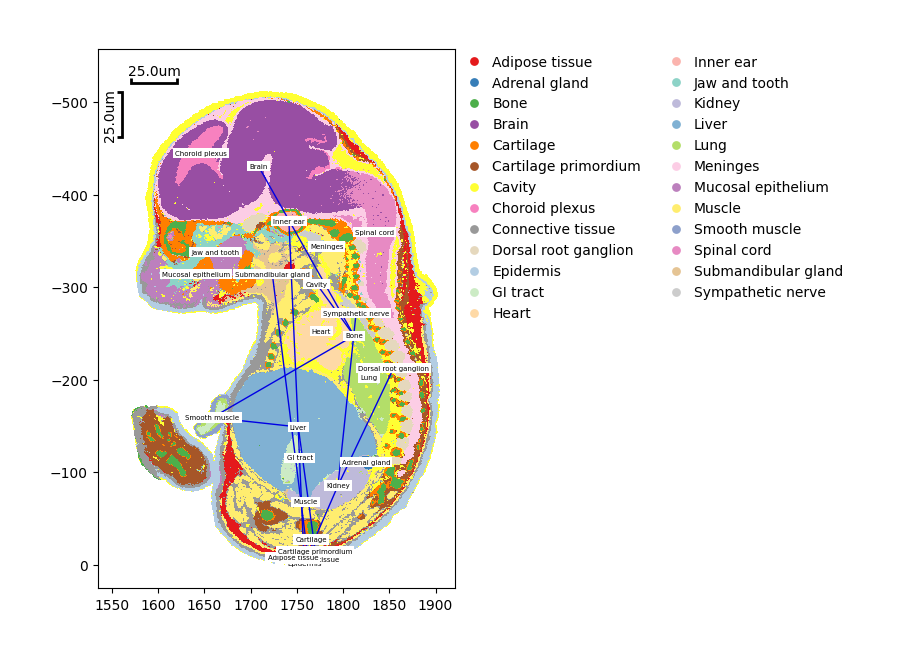

In [6]:
x_raw = data.position[:, 0]
y_raw = data.position[:, 1]

data.plt.plot_cluster_traj(
        data.tl.result['paga']['connectivities_tree'].todense(), 
        x_raw,
        y_raw,
        data.cells['annotation'].to_numpy(), 
        lower_thresh_not_equal=0.95, 
        count_thresh=100, 
        eps_co=30, 
        check_surr_co=20,
        show_ticks=True,
        type_traj="straight",
        plotting_scale_width=50,
        )

## DPT

The chronology of differentiated cells is essentially implicit in their single-cell expression products. Diffusion pseudotime (DPT) is an efficient way to estimate this order, which uses diffusion-like random walks to measure cell-to-cell metastasis. Our DPT method enables the reconstruction of cellular development, identifying transient or metastable states, branching decisions, and differentiation endpoints.

As an example, we choose the first 100 leiden-1 cells as root cells.

In [7]:
import numpy as np

# setting the `iroot` to data.tl.result
data.tl.result['iroot'] = np.flatnonzero(data.cells['annotation'] == 'Heart')[100]
data.tl.dpt(n_branchings=0)

[2023-08-28 17:43:32][Stereo][27850][MainThread][140368996955968][st_pipeline][71][INFO]: register algorithm dpt to <stereo.core.st_pipeline.AnnBasedStPipeline object at 0x7fa9e1cbf070>
[2023-08-28 17:43:32][Stereo][27850][MainThread][140368996955968][main][1026][WARNING]: Trying to run `tl.dpt` without prior call of `tl.diffmap`. Falling back to `tl.diffmap` with default parameters.
[2023-08-28 17:43:32][Stereo][27850][MainThread][140368996955968][main][15][INFO]: computing Diffusion Maps using n_comps=15(=n_dcs)
[2023-08-28 17:43:32][Stereo][27850][MainThread][140368996955968][struct][717][INFO]: computing transitions
[2023-08-28 17:43:32][Stereo][27850][MainThread][140368996955968][struct][740][INFO]:     finished
[2023-08-28 17:43:58][Stereo][27850][MainThread][140368996955968][struct][802][INFO]:     eigenvalues of transition matrix
    [1.         0.9995115  0.9992853  0.99891794 0.9985696  0.99845654
     0.99833506 0.9982842  0.9979959  0.99753714 0.9973932  0.99624395
     0.9

## Vector Plot 

The stream-mode (setting parameter `type` as `stream`) vector plot firstly we showing, is a plot who describes the steam that one cluster flows to the other, displaying the cluster-clusetr's interactive direction.

[2023-08-28 17:43:58][Stereo][27850][MainThread][140368996955968][plot_collection][61][INFO]: register plot_func plot_vec to <stereo.plots.plot_collection.PlotCollection object at 0x7faa2474a2e0>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

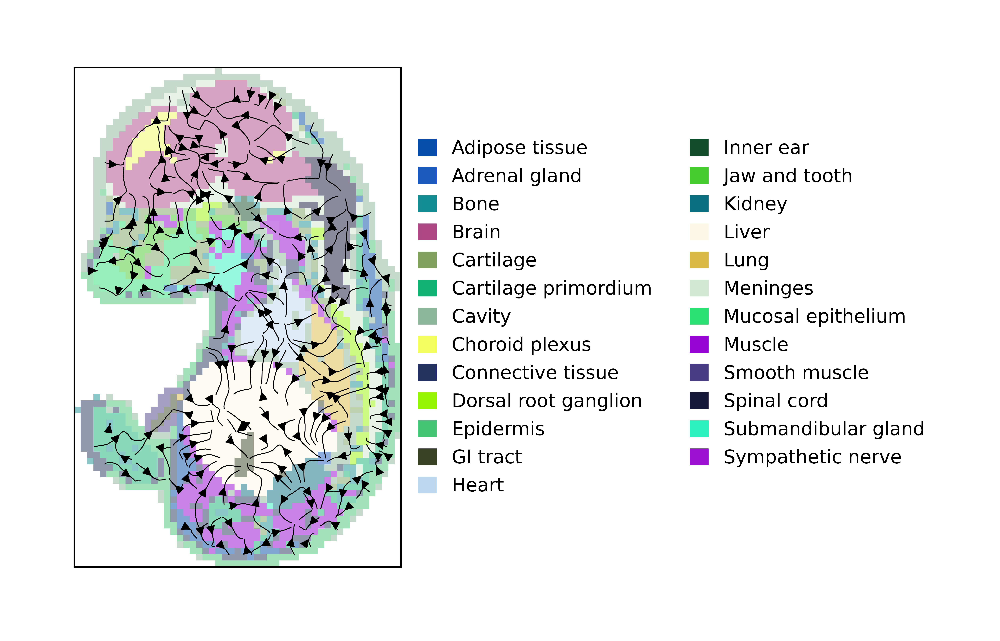

In [8]:
data.plt.plot_vec(
        data.position[:, 0],
        data.position[:, 1],
        data.cells['annotation'].to_numpy(),
        data.tl.result['dpt_pseudotime'],
        type='stream',
        line_width=0.5,
        background='field',
        num_pix=50,
        filter_type='gauss',
        sigma_val=1,
        radius_val=3,
        scatter_s=0.1,
        density=2,
        seed_val=0,
        num_legend_per_col=20,
        dpi_val=1000
        )

We could also use the result to complete vec-mode plot.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

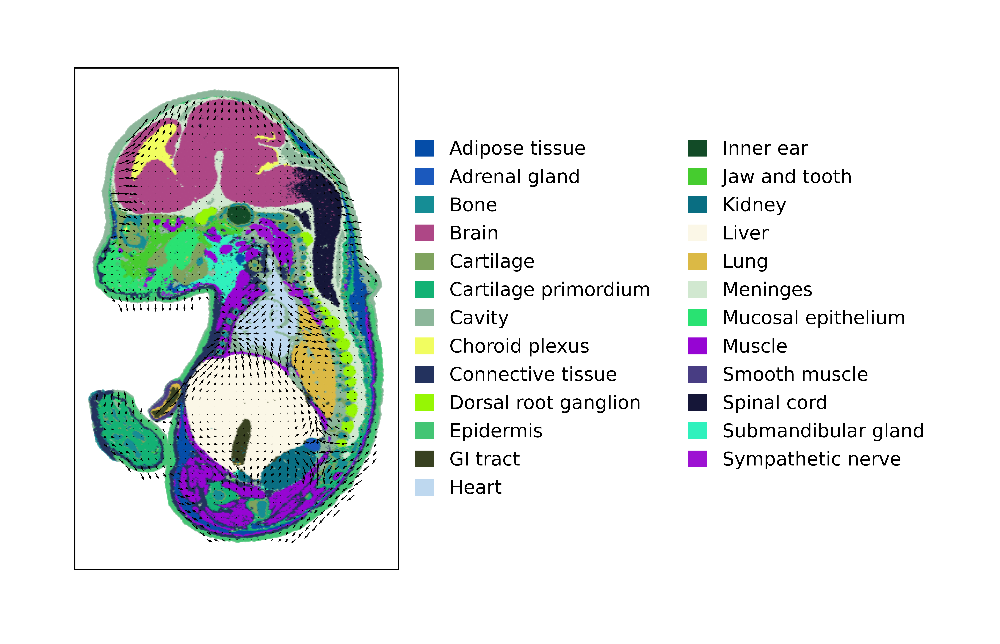

In [9]:
data.plt.plot_vec(
        data.position[:, 0],
        data.position[:, 1],
        data.cells['annotation'].to_numpy(),
        data.tl.result['dpt_pseudotime'],
        type='vec',
        background='scatter',
        num_pix=40,
        filter_type='gauss',
        sigma_val=2,
        radius_val=1,
        scatter_s=2,
        density=2,
        seed_val=0,
        dpi_val=1000
        )

[2023-08-28 17:44:21][Stereo][27850][MainThread][140368996955968][plot_collection][61][INFO]: register plot_func plot_time_scatter to <stereo.plots.plot_collection.PlotCollection object at 0x7faa2474a2e0>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

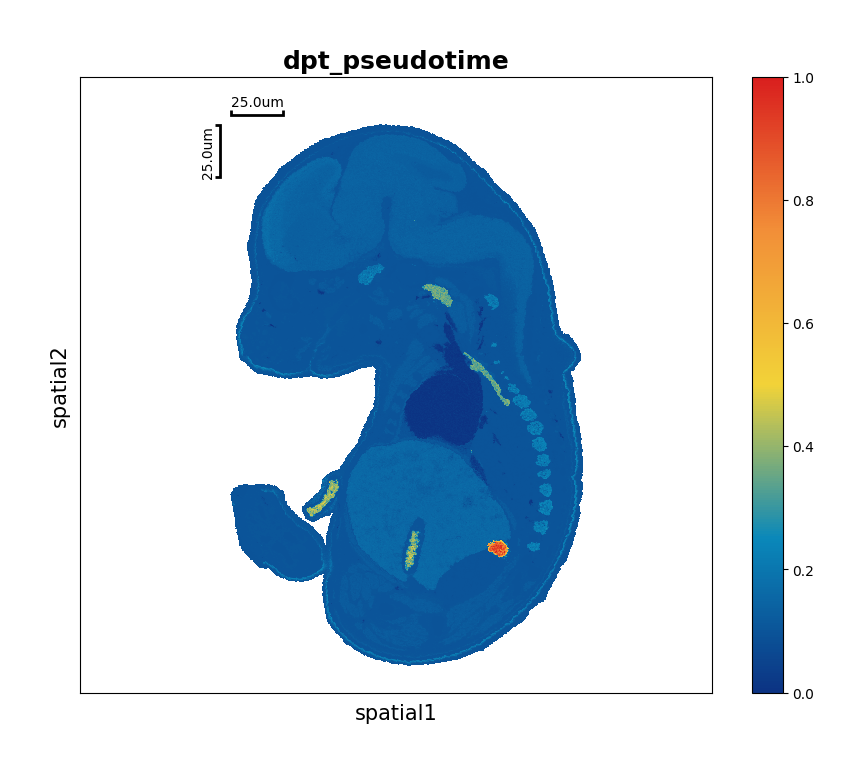

In [10]:
data.plt.plot_time_scatter(group='annotation', plotting_scale_width=50)

## Temporal Gene Pattern for Serially up & down Regulated Genes along Trajectory

Stereopy also provideS a method to explore the genes that highly correlated to the development trajectory. The gene expression exhibits a certain pattern along the trajectory. For example, you can use ```time_series_analysis``` to find up or down-regulated genes during developmental trajectory.

In [43]:
data.tl.time_series_analysis(
        run_method='tvg_marker', 
        use_col='annotation',                      
        branch=['Meninges', 'Spinal cord', 'Brain', 'Choroid plexus'],                 
        p_val_combination='FDR'
        )

In [46]:
data.genes.to_df().sort_values('less_pvalue').iloc[:3]

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,n_counts,mean_umi,means,dispersions,dispersions_norm,highly_variable,less_pvalue,greater_pvalue,logFC
gene_short_name,,,,,,,,,,,,,,,,
Maged2,345612,1.850590,1.047526,33.640160,963815,13.778656,69461,180645,2.600668,1.341792,1.684338,-0.067022,False,0.0,1.0,-0.297680
Zic1,119459,0.471394,0.386210,77.063065,245509,12.411093,15356,29563,1.925176,0.386231,1.757356,0.753279,True,0.0,1.0,-0.589895
Arl4a,116631,0.385621,0.326148,77.606060,200837,12.210254,24944,44525,1.784998,0.537469,1.619996,0.238958,False,0.0,1.0,-0.569405


In [48]:
data.genes.to_df().sort_values('greater_pvalue').iloc[:3]

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,n_counts,mean_umi,means,dispersions,dispersions_norm,highly_variable,less_pvalue,greater_pvalue,logFC
gene_short_name,,,,,,,,,,,,,,,,
Rbm8a,260785,1.180006,0.779328,49.927517,614565,13.328672,44688,80943,1.811292,0.816275,1.484916,-0.517636,False,1.0,0.0,0.284369
Hectd2,21992,0.060603,0.058838,95.777387,31563,10.359773,5315,7915,1.489182,0.106961,1.295038,-0.326758,False,1.0,0.0,0.734435
Set,388321,2.677648,1.302273,25.439743,1394559,14.148090,77428,200522,2.589787,1.389074,1.403744,-0.791259,False,1.0,0.0,0.242148


[2023-10-17 11:18:15][Stereo][578][MainThread][140523920922432][plot_collection][61][INFO]: register plot_func boxplot_transit_gene to <stereo.plots.plot_collection.PlotCollection object at 0x7fcb0ca2f2e0>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

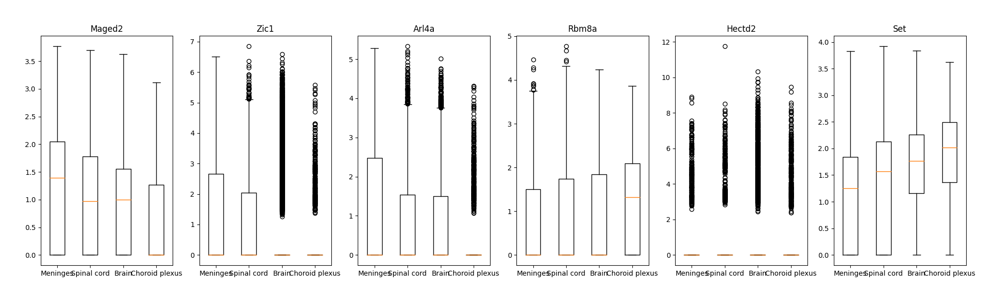

In [49]:
data.plt.boxplot_transit_gene(
                use_col='annotation',
                branch=['Meninges', 'Spinal cord', 'Brain', 'Choroid plexus'],
                genes=['Maged2', 'Zic1', 'Arl4a', 'Rbm8a', 'Hectd2', 'Set']
                )

## Fuzzy'C means to cluster genes on spatial & temporal pattern

Except for up or down regulated genes, there is the other expression pattern also important. Stereopy considers both temporal and spatial information and based on which cluster genes into serveral groups.

# <font color='red'>TODO:</font>
下面这个函数需要暴露出更多的参数接口

In [53]:
data.tl.time_series_analysis(run_method='other', cluster_number=4)

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

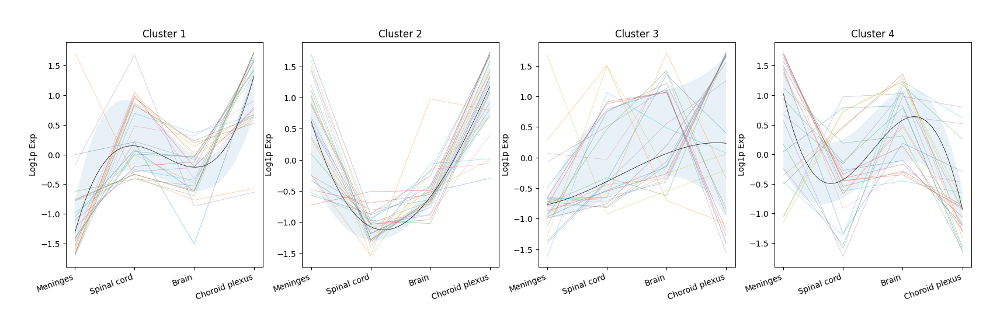

In [59]:
data.plt.fuzz_cluster_plot(
        use_col='annotation',
        branch=['Meninges', 'Spinal cord', 'Brain', 'Choroid plexus'], 
        threshold = 'p99.9',
        n_col = 4, 
        summary_trend=True, 
        width = None, 
        height = None
        )